In [2]:
import os, sys, glob

import cv2
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

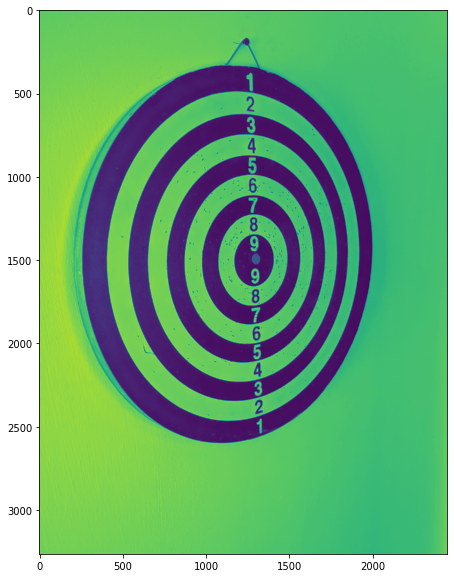

In [3]:
def get_median_pixels(img_dir):

    images = glob.glob(f"{img_dir}/*.jpg")
    # Load the images and convert them to NumPy arrays
    image_arrays = [cv2.cvtColor(cv2.imread(image), cv2.COLOR_BGR2GRAY) for image in images]

    # Calculate the median along the axis of the stacked images for each pixel
    pixel_medians = np.median(image_arrays, axis=0).astype(np.uint8)

    return pixel_medians

median_img = get_median_pixels("train/Task1")
plt.figure(figsize=(10,10))
plt.imshow(median_img/ 255.)

In [270]:
import math

train/Task1/01.jpg
14
Area: 49127.5


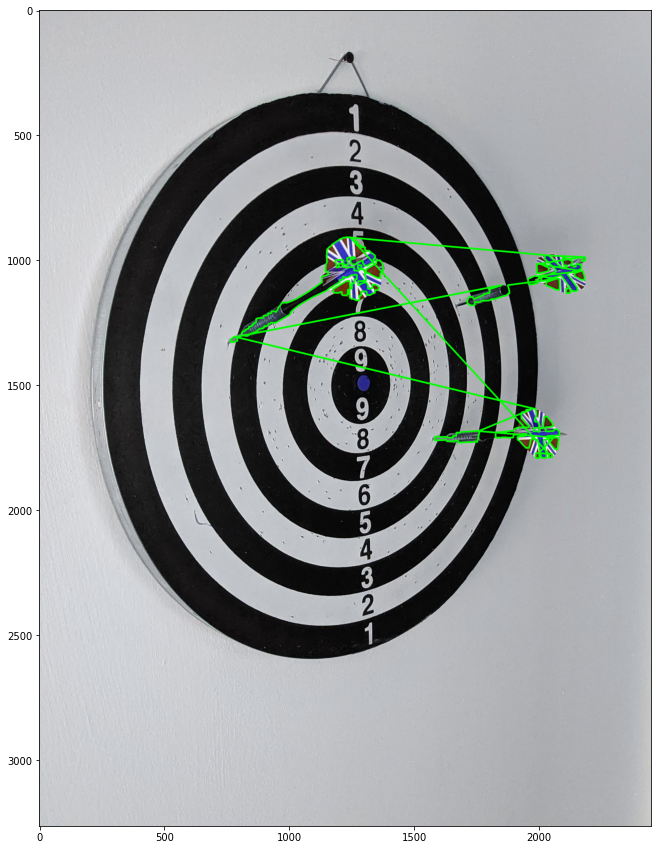

train/Task1/02.jpg
7
Area: 22920.0


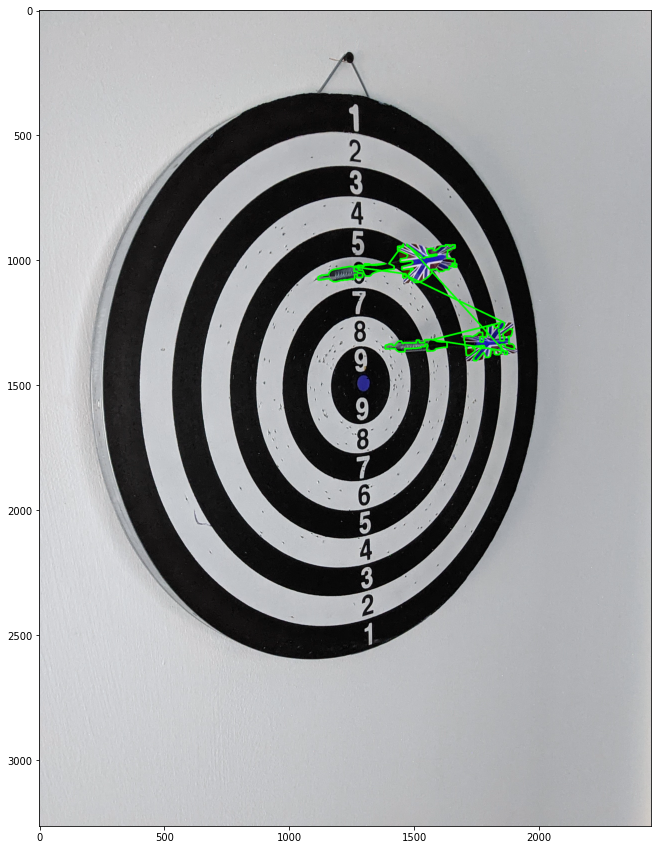

train/Task1/03.jpg
19
Area: 94054.5


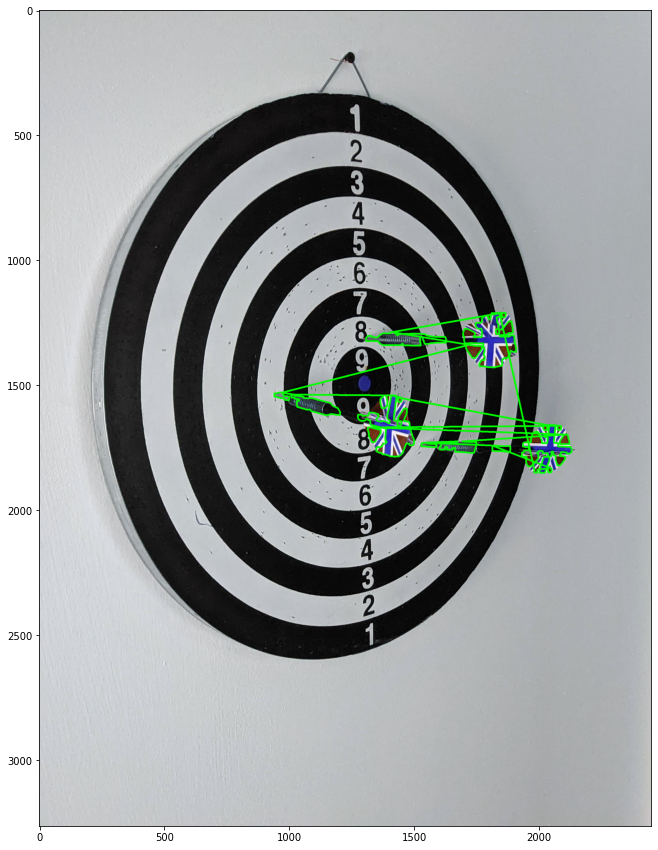

train/Task1/04.jpg
6
Area: 2616.0


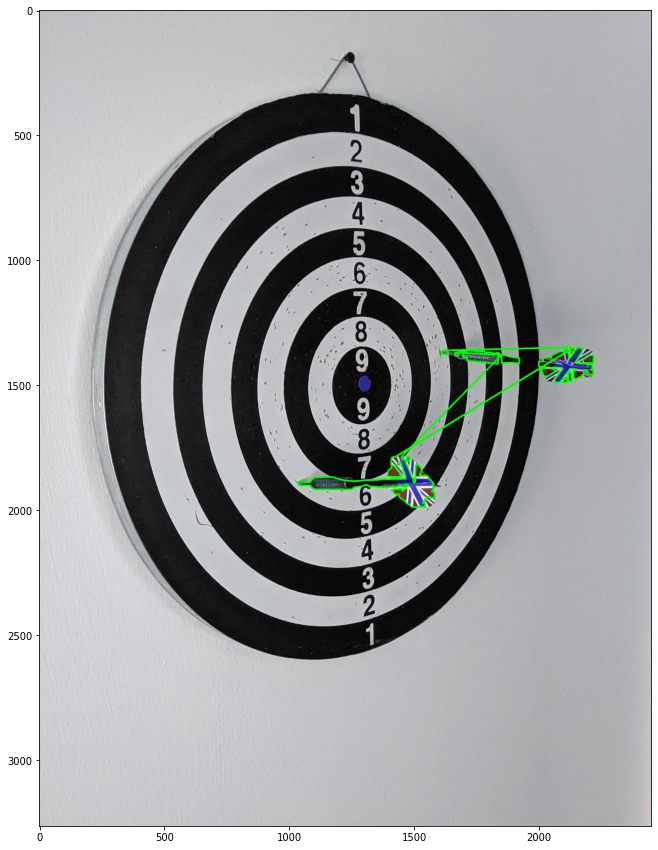

train/Task1/05.jpg
6
Area: 16989.5


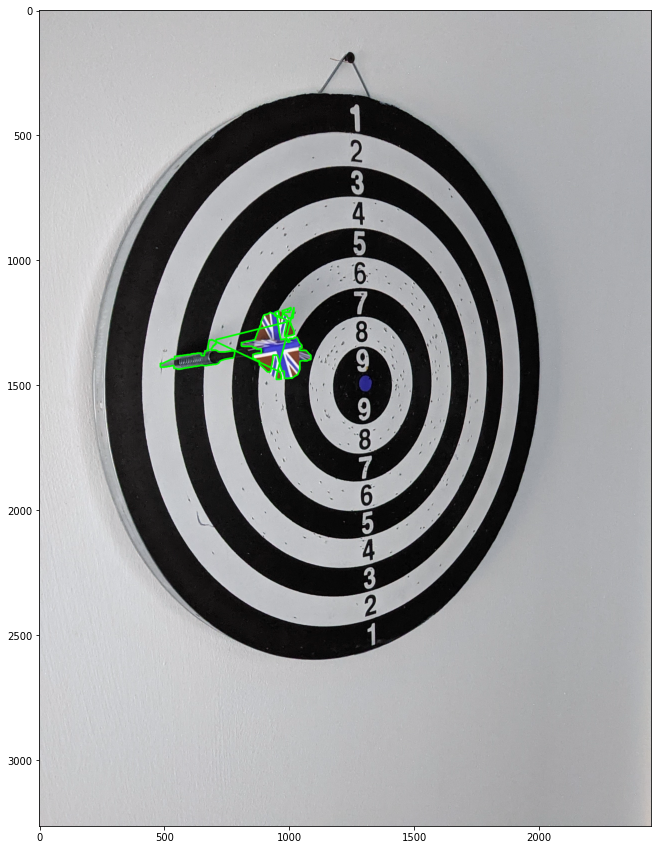

train/Task1/06.jpg
10
Area: 38477.0


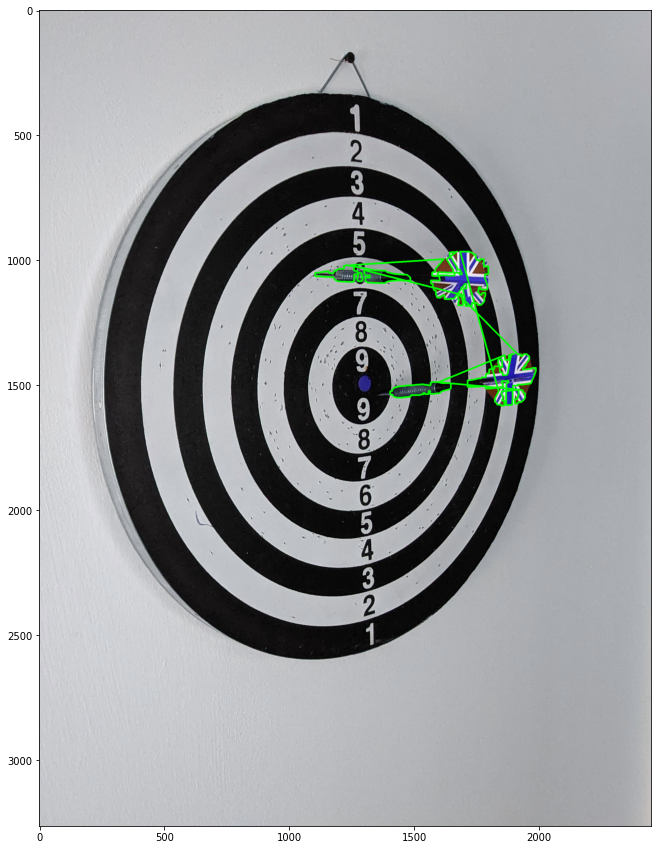

train/Task1/07.jpg
5
Area: 11145.0


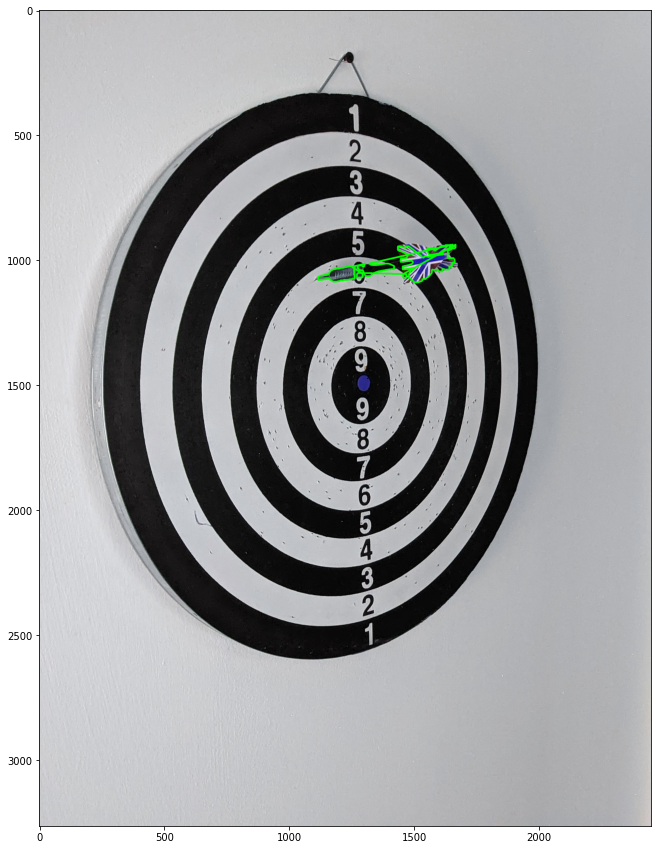

train/Task1/08.jpg
7
Area: 51764.0


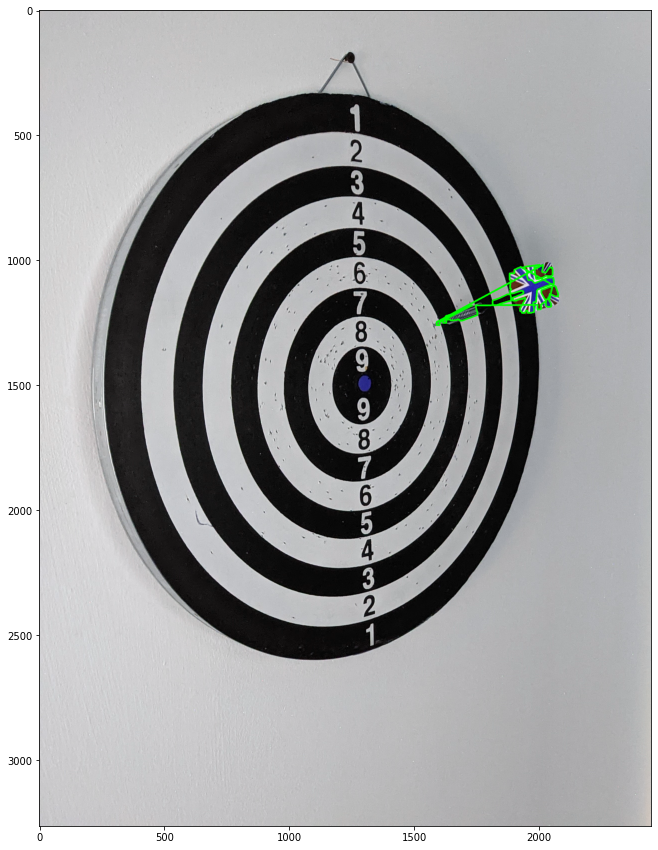

train/Task1/09.jpg
12
Area: 63053.0


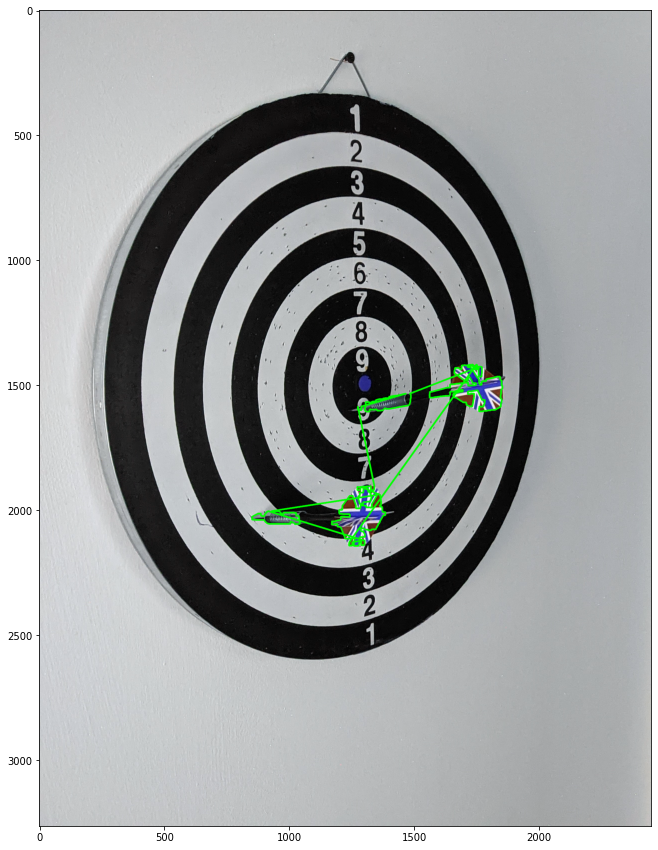

train/Task1/10.jpg
11
Area: 44644.0


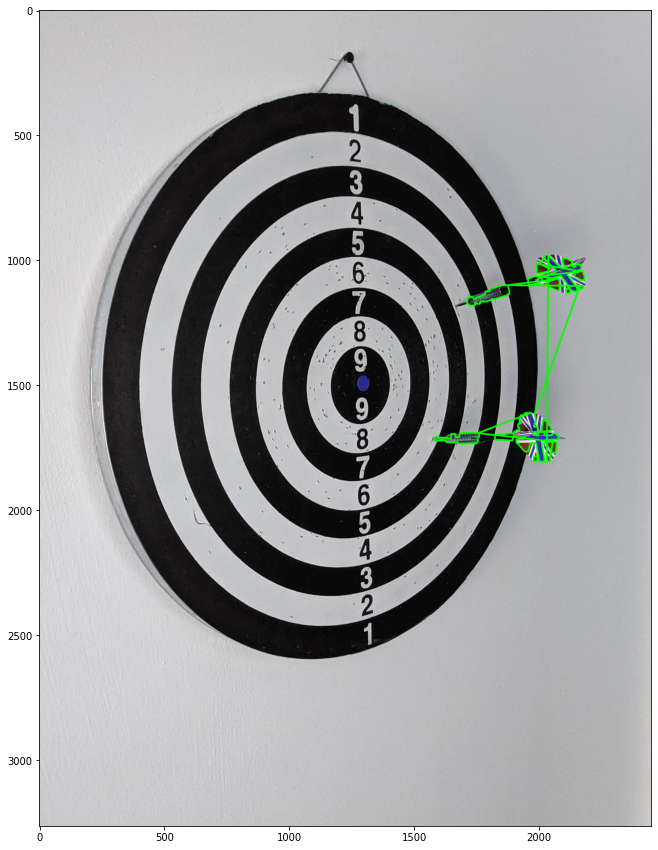

In [4]:
def dilate_erode(image):
    dilate_kernel_size = 7
    erode_kernel_size = 5

    # Create the structuring elements for dilation and erosion
    dilate_kernel = np.ones((dilate_kernel_size, dilate_kernel_size), np.uint8)
    erode_kernel = np.ones((erode_kernel_size, erode_kernel_size), np.uint8)

    # Perform dilation
    dilated_image = cv2.dilate(image, dilate_kernel, iterations=1)

    # Perform erosion
    eroded_image = cv2.erode(dilated_image, erode_kernel, iterations=1)
    return eroded_image

def compute_new_objects(current_image, background):
    # Convert current image to grayscale
    current_gray = cv2.cvtColor(current_image, cv2.COLOR_BGR2GRAY)

    current_gray = cv2.GaussianBlur(current_gray, (5, 5), 0)
    background = cv2.GaussianBlur(background, (5, 5), 0)
    
    # Compute absolute difference between current image and background
    diff = cv2.absdiff(current_gray, background)

    # Apply thresholding to obtain binary foreground mask
    _, mask = cv2.threshold(diff, 30, 255, cv2.THRESH_BINARY)
    
    # Apply morphological operations to remove noise
    mask = cv2.morphologyEx(mask, cv2.MORPH_OPEN, kernel=np.ones((11, 11), dtype=np.uint8))
    mask = dilate_erode(mask)
    # Find contours of objects
    contours, hierarchy = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE) # or retr_tree
    return contours, hierarchy


def combine_adjacent_contours(contours, hierarchy, distance_threshold):
    combined_contours = []
    visited = [False] * len(contours)

    for i in range(len(contours)):
        if visited[i]:
            continue

        combined_contour = contours[i]
        visited[i] = True

        current_hierarchy = hierarchy[0][i]

        while current_hierarchy[0] != -1:
            next_contour_index = current_hierarchy[0]
            if not visited[next_contour_index]:
                next_contour = contours[next_contour_index]

                # Calculate the distance between the current and next contour's centers
                current_center = get_contour_center(combined_contour)
                next_center = get_contour_center(next_contour)
                distance = math.sqrt((next_center[0] - current_center[0]) ** 2 + (next_center[1] - current_center[1]) ** 2)

                # Check if the contours are close enough to be considered adjacent
                if distance <= distance_threshold:
                    combined_contour = np.concatenate((combined_contour, next_contour))
                    visited[next_contour_index] = True

            current_hierarchy = hierarchy[0][next_contour_index]

        combined_contours.append(combined_contour)

    return combined_contours


def get_contour_center(contour):
    moments = cv2.moments(contour)
    center_x = int(moments['m10'] / moments['m00'])
    center_y = int(moments['m01'] / moments['m00'])
    return center_x, center_y


def eliminate_self_intersections(contour, epsilon):
    # Approximate the contour to remove self-intersections
    approx = cv2.approxPolyDP(contour, epsilon, True)

    return approx

def merge_intersecting_contours(contours):
    merged_contours = []

    for i in range(len(contours)):
        contour1 = contours[i]
        is_merged = False

        for j in range(i+1, len(contours)):
            contour2 = contours[j]

            # Check for intersection between contour1 and contour2
            if cv2.intersectConvexConvex(contour1, contour2):
                # Combine contour1 and contour2 into a single contour
                merged_contour = cv2.convexHull(np.concatenate((contour1, contour2)))
                contour1 = merged_contour
                is_merged = True

        if not is_merged:
            merged_contours.append(contour1)
    return merged_contours


def combine_bounding_boxes(box1, box2):
    combined_box = np.concatenate([box1, box2], axis=0)
    return combined_box

def get_union(box1, box2):
    combined_box = np.concatenate([box1, box2], axis=0)
    combined_contours = cv2.minAreaRect(combined_box)


# def combine_contours(box1, box2):
#     combined_contours = 




for i in range(1,11):
# for i in [5, 8]:
    print(f"train/Task1/{i if i>9 else f'0{i}'}.jpg")
    img = cv2.imread(f"train/Task1/{i if i>9 else f'0{i}'}.jpg")
    # img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    contours, hierarchy = compute_new_objects(img, median_img)

    #contours = combine_adjacent_contours(contours, hierarchy, 100)

    # contours = [eliminate_self_intersections(contour, 0.01) for contour in contours]
    # contours = merge_intersecting_contours(contours)
    
    # image_with_contours = cv2.drawContours(img, contours, -1, (0, 255, 0), 5)
    image_with_contours = img.copy()
    big_contour = None

    for i, contour in enumerate(contours):
        # contour = np.array(contour, dtype=np.uint8)
        # print(contour.shape)

        # bbox = cv2.minAreaRect(contour)


        if big_contour is None:
            big_contour = contour
        else:
        # Draw the bounding box on the image
            big_contour = combine_bounding_boxes(big_contour, contour)

        
            # cv2.drawContours(image_with_contours, [big_contour], 0, (255, 0, 0), 5)
        #     # big_contour = None
        # cv2.drawContours(image_with_contours, [bbox], -1, (255, 0, 0), 5)
    
    # big_contour = cv2.minAreaRect(big_contour)
    # big_contour = cv2.boxPoints(big_contour).astype(np.int32)
    cv2.drawContours(image_with_contours, [big_contour], 0, (0, 255, 0), 5)

    print(len(contours))
    print(f"Area: {cv2.contourArea(big_contour)}")


    plt.figure(figsize=(15,15))
    plt.imshow(image_with_contours)
    plt.show()

    #TODO: iterate over the values and find a combination
    # so that the resulting combinations are smaller
    # than a predefined threshold: maybe 170-200k? 

In [46]:
import cv2
import numpy as np

def merge_contours(contours, distance_threshold):
    # Compute the bounding boxes for each contour
    bounding_boxes = [cv2.boundingRect(contour) for contour in contours]

    # Initialize a list to store merged bounding boxes
    merged_boxes = []

    # Merge close bounding boxes
    for i, box in enumerate(bounding_boxes):
        merge = True
        for j in range(i + 1, len(bounding_boxes)):
            # Calculate the centers of the bounding boxes
            center_i = (box[0] + box[2] // 2, box[1] + box[3] // 2)
            center_j = (bounding_boxes[j][0] + bounding_boxes[j][2] // 2, bounding_boxes[j][1] + bounding_boxes[j][3] // 2)

            # Calculate the distance between the centers
            distance = np.linalg.norm(np.array(center_i) - np.array(center_j))

            # Check if the distance is below the threshold
            if distance <= distance_threshold:
                # Merge the bounding boxes
                merge = False
                x = min(box[0], bounding_boxes[j][0])
                y = min(box[1], bounding_boxes[j][1])
                w = max(box[0] + box[2], bounding_boxes[j][0] + bounding_boxes[j][2]) - x
                h = max(box[1] + box[3], bounding_boxes[j][1] + bounding_boxes[j][3]) - y
                merged_boxes.append((x, y, w, h))

        # If no close bounding box found, add it to the merged boxes list
        if merge:
            merged_boxes.append(box)

    return merged_boxes



def find_flag(path):
    image = cv2.imread(path)
    # Convert the image to HSV
    hsv_image = cv2.cvtColor(image.copy(), cv2.COLOR_BGR2HSV)
    # Define the color range for red, white, and blue in HSV
    lower_red = np.array([0, 50, 50])
    upper_red = np.array([10, 255, 255])

    # lower_white = np.array([100, 0, 200])
    # upper_white = np.array([180, 50, 255])

    lower_blue = np.array([110, 50, 50])
    upper_blue = np.array([130, 255, 255])
    # Create masks for red, white, and blue
    red_mask = cv2.inRange(hsv_image, lower_red, upper_red)
    # white_mask = cv2.inRange(hsv_image, lower_white, upper_white)
    blue_mask = cv2.inRange(hsv_image, lower_blue, upper_blue)
    # Combine the masks
    british_flag_mask = cv2.bitwise_or(red_mask, blue_mask)#cv2.bitwise_or(red_mask, cv2.bitwise_or(white_mask, blue_mask))
    # Apply the mask to the original image
    british_flag_regions = cv2.bitwise_and(image, image, mask=british_flag_mask)

    contours, _ = cv2.findContours(british_flag_regions, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # for contour in contours:
    #     if cv2.contourArea(contour) > 100:

    # contours = merge_contours(contours)

    cv2.drawContours(image, contours, -1, (0, 255, 0), 5)
    


    # merged_boxes = merge_contours(contours, 30)
    # for box in merged_boxes:
    #     x, y, w, h = box
    #     cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)

    plt.figure(figsize=(15,15))
    plt.imshow(image)#british_flag_regions
    plt.show()

for i in range(1, 20):
    path = f'train/Task1/{ "0" + str(i) if i<10 else i}.jpg'
    print(path)
    find_flag(path)

train/Task1/01.jpg


error: OpenCV(4.5.5) D:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\contours.cpp:197: error: (-210:Unsupported format or combination of formats) [Start]FindContours supports only CV_8UC1 images when mode != CV_RETR_FLOODFILL otherwise supports CV_32SC1 images only in function 'cvStartFindContours_Impl'


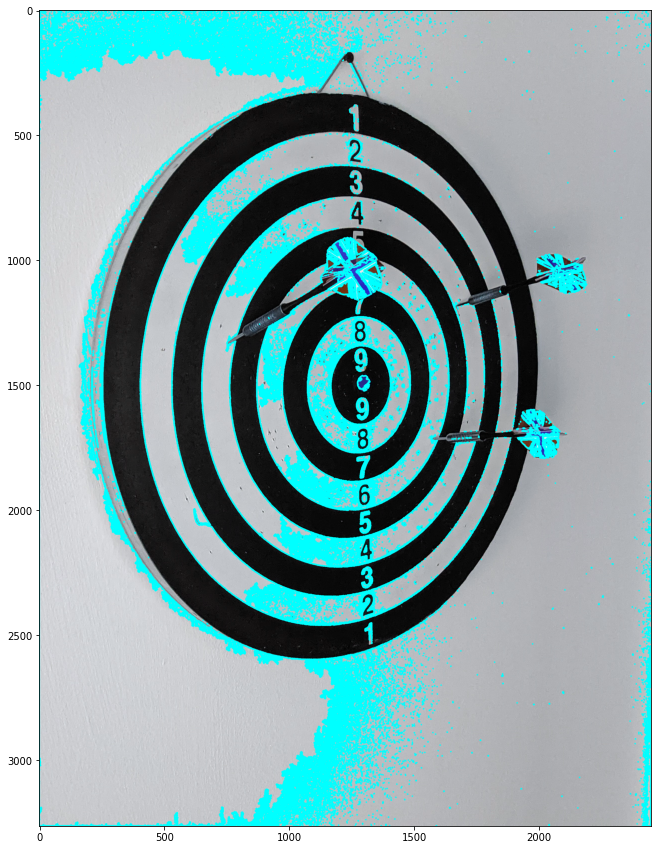

In [27]:
import cv2
import numpy as np

# Load the image and convert to HSV
image = cv2.imread('train/Task1/01.jpg')
hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

# Define the color ranges for red, white, and blue in HSV
lower_red = np.array([0, 100, 100])
upper_red = np.array([10, 255, 255])

lower_white = np.array([0, 0, 200])
upper_white = np.array([180, 50, 255])

lower_blue = np.array([110, 100, 100])
upper_blue = np.array([130, 255, 255])

# Create masks for red, white, and blue
red_mask = cv2.inRange(hsv_image, lower_red, upper_red)
white_mask = cv2.inRange(hsv_image, lower_white, upper_white)
blue_mask = cv2.inRange(hsv_image, lower_blue, upper_blue)

# Find contours for each color mask
red_contours, _ = cv2.findContours(red_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
white_contours, _ = cv2.findContours(white_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
blue_contours, _ = cv2.findContours(blue_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Draw the contours on the original image
image_with_contours = image.copy()
cv2.drawContours(image_with_contours, red_contours, -1, (0, 255, 255), 5)
cv2.drawContours(image_with_contours, white_contours, -1, (0, 255, 255), 5)
cv2.drawContours(image_with_contours, blue_contours, -1, (0, 255, 255), 5)


plt.figure(figsize=(15,15))
plt.imshow(image_with_contours)
plt.show()


In [396]:
img = np.array(Image.open("train/Task1/01.jpg")).astype(np.uint8)
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
img = cv2.GaussianBlur(img, (15, 15), 0)
# plt.imshow( (img - median_img.astype(np.uint8)) / 255. )

difference = cv2.absdiff(img.astype(np.uint8), 
                         cv2.cvtColor(cv2.GaussianBlur(median_img.astype(np.uint8), (15, 15), 0), cv2.COLOR_BGR2GRAY)
                         )
plt.figure(figsize=(10,10))
plt.imshow(difference)


error: OpenCV(4.5.5) d:\a\opencv-python\opencv-python\opencv\modules\imgproc\src\color.simd_helpers.hpp:92: error: (-2:Unspecified error) in function '__cdecl cv::impl::`anonymous-namespace'::CvtHelper<struct cv::impl::`anonymous namespace'::Set<3,4,-1>,struct cv::impl::A0x7123906f::Set<1,-1,-1>,struct cv::impl::A0x7123906f::Set<0,2,5>,2>::CvtHelper(const class cv::_InputArray &,const class cv::_OutputArray &,int)'
> Invalid number of channels in input image:
>     'VScn::contains(scn)'
> where
>     'scn' is 1


In [397]:
import cv2
import numpy as np

def display_image_difference(median_img):

    median_img = median_img.astype(np.uint8)#cv2.cvtColor(, cv2.COLOR_BGR2GRAY)
    # Load the images
    img = cv2.imread(("train/Task1/06.jpg")).astype(np.uint8)
    # img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # img = cv2.GaussianBlur(img, (15, 15), 0)

    # Compute the absolute difference between the images
    difference = cv2.absdiff(img, median_img)
 
    # Convert the difference image to grayscale
    difference_gray = cv2.cvtColor(difference, cv2.COLOR_BGR2GRAY)

    # Threshold the difference image to create a binary mask
    _, thresholded = cv2.threshold(difference_gray, 30, 255, cv2.THRESH_BINARY)

    kernel = np.ones((7, 7), np.uint8)
    # thresholded = cv2.morphologyEx(thresholded, cv2.MORPH_CLOSE,kernel)
    thresholded = cv2.erode(thresholded, kernel, cv2.BORDER_REFLECT, iterations=1)
    thresholded = cv2.dilate(thresholded, kernel, cv2.BORDER_REFLECT, iterations=1)
    plt.figure(figsize=(10,10))
    plt.imshow(thresholded)

display_image_difference(median_img)

error: OpenCV(4.5.5) D:\a\opencv-python\opencv-python\opencv\modules\core\src\arithm.cpp:650: error: (-209:Sizes of input arguments do not match) The operation is neither 'array op array' (where arrays have the same size and the same number of channels), nor 'array op scalar', nor 'scalar op array' in function 'cv::arithm_op'


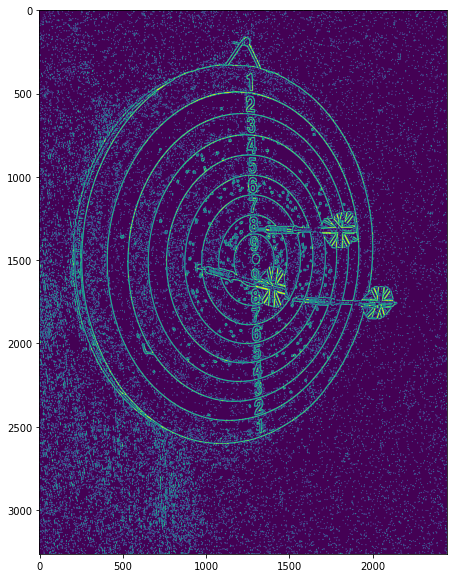

In [401]:
img = cv2.imread('train/Task1/03.jpg', cv2.IMREAD_UNCHANGED)
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# Function to perform Difference of Gaussians
def difference_of_Gaussians(img, k1, s1, k2, s2):
    b1 = cv2.GaussianBlur(img,(k1, k1), s1)
    b2 = cv2.GaussianBlur(img,(k2, k2), s2)
    return b1 - b2

dog_img = difference_of_Gaussians(gray, 7, 7, 5, 5)

dog_img = cv2.morphologyEx(dog_img, cv2.MORPH_OPEN, kernel=np.ones((3, 3), dtype=np.uint8))

# cv2.findContours(image, )

plt.figure(figsize=(10,10))
plt.imshow(dog_img)

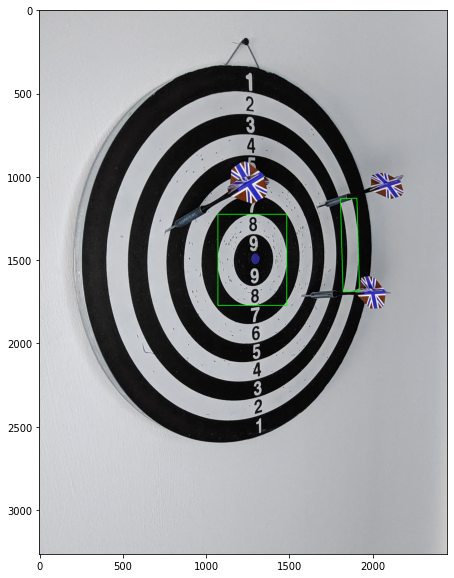

In [227]:
th = cv2.threshold(dog_img ,127,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)[1]
contours, hierarchy = cv2.findContours(th, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)

# Create copy of original image
img1 = img.copy()

# for each contour above certain area and extent, draw minimum bounding box  
for c in contours:
    area = cv2.contourArea(c)
    if area > 1500:
        x,y,w,h = cv2.boundingRect(c)
        extent = int(area)/(w*h)                
        if extent > 0.6:
            rect = cv2.minAreaRect(c)
            box = cv2.boxPoints(rect)
            box = np.int0(box)
            cv2.drawContours(img1,[box],0,(0,255,0),4)

plt.figure(figsize=(10,10))
plt.imshow(img1)

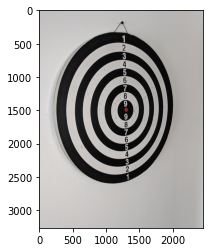

In [93]:
plt.imshow(median_img/255)

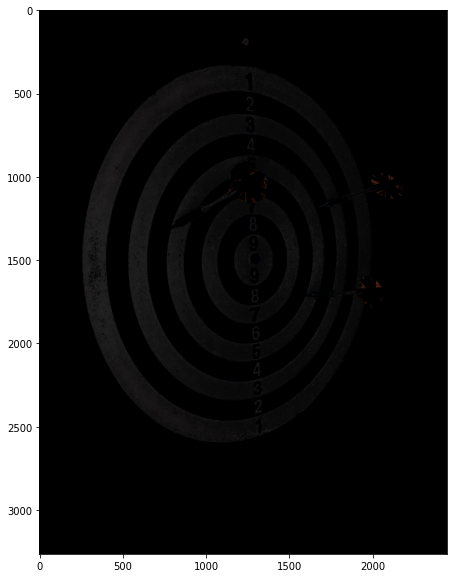

In [207]:
image = cv2.imread(("train/Task1/01.jpg")).astype(np.uint8)
# gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
img = image.copy()


image = image * np.repeat((image[:, :, 2]  < 40).reshape((*image.shape[:2], 1)), 3, 2)
image = image * np.repeat((image[:, :, 1] < 40).reshape((*image.shape[:2], 1)), 3, 2)
image += img * np.repeat((image[:, :, 0] > 110).reshape((*image.shape[:2], 1)), 3, 2)

# image = cv2.Canny(img, 50, 150)

plt.figure(figsize=(10,10))
plt.imshow(image)


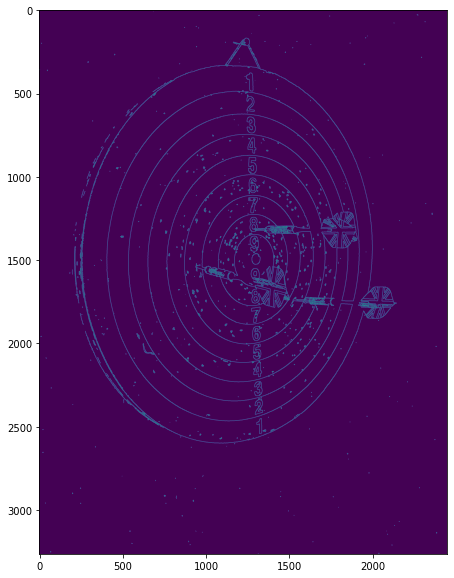

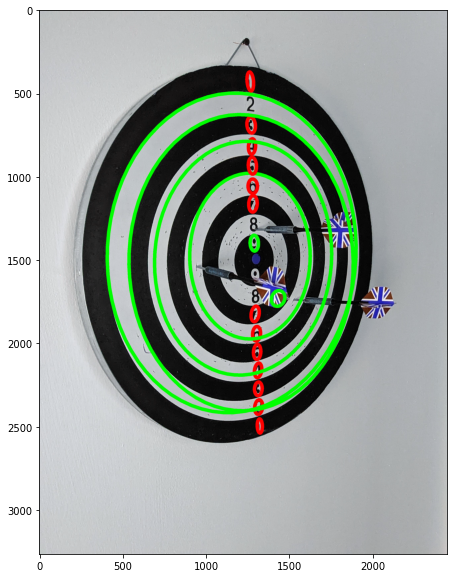

In [194]:

image = cv2.imread(("train/Task1/03.jpg")).astype(np.uint8)


# Convert the image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply edge detection to find the edges of the inner ellipse
edges = cv2.Canny(gray, 80, 200)#threshold1=30, threshold2=100)

plt.figure(figsize=(10,10))
plt.imshow(edges)
# Find contours in the edge-detected image
contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Filter contours based on area, aspect ratio, or other criteria
filtered_contours = []
for contour in contours:
    area = cv2.contourArea(contour)
    if area > 1000:  # Adjust the minimum area threshold as per your requirement
        filtered_contours.append(contour)

# Fit ellipses around the filtered contours
ellipses = []
for contour in filtered_contours:

    ellipse = cv2.fitEllipse(contour)
    ellipses.append(ellipse)

# Draw the ellipses on the original image
image_with_ellipses = np.copy(image)
for ellipse in ellipses:


    center_x = int(ellipse[0][0])
    center_y = int(ellipse[0][1])

    if 1100 < center_x < 1500 and\
       1300 < center_y < 1800:
        cv2.ellipse(image_with_ellipses, ellipse, (0, 255, 0), 20)
    else:
        cv2.ellipse(image_with_ellipses, ellipse, (255, 0, 0), 20)
# Display the filtered image

plt.figure(figsize=(10,10))
plt.imshow(image_with_ellipses)



In [186]:
ellipses[0]

AttributeError: 'tuple' object has no attribute 'center'

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


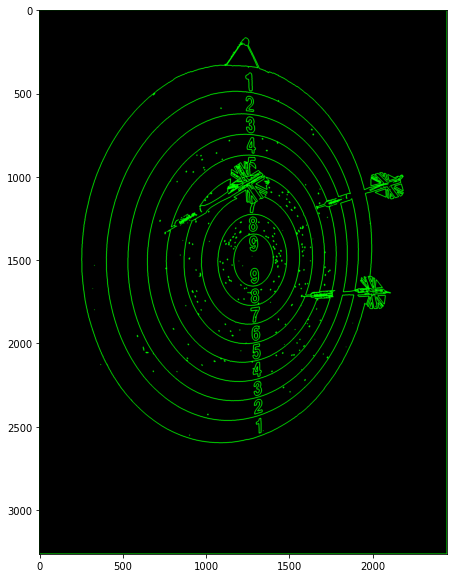

In [162]:
import cv2
import numpy as np

def visualize_contours(image_path):
    # Load the image
    img = cv2.imread(image_path, cv2.IMREAD_UNCHANGED)

    #convert img to grey
    img_grey = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
    #set a thresh
    thresh = 100
    #get threshold image
    ret,thresh_img = cv2.threshold(img_grey, thresh, 255, cv2.THRESH_BINARY)
    #find contours
    contours, hierarchy = cv2.findContours(thresh_img, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)



    #create an empty image for contours
    img_contours = np.zeros(img.shape)
    # draw the contours on the empty image
    cv2.drawContours(img_contours, contours, -1, (0,255,0), 3)

    plt.figure(figsize=(10,10))
    plt.imshow(img_contours)

# Example usage
image_path = "train/Task1/01.jpg"

visualize_contours(image_path)

In [ ]:

def filter_straight_lines(image_path, threshold=100, rho_resolution=1, theta_resolution=np.pi/180):
    # Load the image
    image = cv2.imread(image_path)

    # Convert the image to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Apply Canny edge detection to obtain edges
    edges = cv2.Canny(gray, 50, 150)

    # Apply Hough Line Transform
    lines = cv2.HoughLines(edges, rho_resolution, theta_resolution, threshold)

    if lines is not None:
        # Create a copy of the original image
        filtered_image = np.copy(image)

        # Draw the filtered lines on the image
        for line in lines:
            rho, theta = line[0]
            a = np.cos(theta)
            b = np.sin(theta)
            x0 = a * rho
            y0 = b * rho
            x1 = int(x0 + 1000 * (-b))
            y1 = int(y0 + 1000 * (a))
            x2 = int(x0 - 1000 * (-b))
            y2 = int(y0 - 1000 * (a))
            cv2.line(filtered_image, (x1, y1), (x2, y2), (0, 0, 255), 2)

        # Display the filtered image
        cv2.imshow("Filtered Image", filtered_image)
        cv2.waitKey(0)
        cv2.destroyAllWindows()

        return filtered_image

    else:
        print("No lines detected in the image.")
        return None

# Example usage
image_path = "train/Task1/01.jpg"

filtered_image = filter_straight_lines(image_path)

In [151]:
contours

(array([[[1324, 2450]],
 
        [[1323, 2451]],
 
        [[1322, 2451]],
 
        [[1322, 2452]],
 
        [[1320, 2454]],
 
        [[1320, 2456]],
 
        [[1319, 2457]],
 
        [[1319, 2459]],
 
        [[1318, 2460]],
 
        [[1318, 2461]],
 
        [[1317, 2462]],
 
        [[1317, 2463]],
 
        [[1312, 2468]],
 
        [[1311, 2468]],
 
        [[1309, 2470]],
 
        [[1308, 2470]],
 
        [[1307, 2471]],
 
        [[1306, 2471]],
 
        [[1303, 2474]],
 
        [[1303, 2483]],
 
        [[1304, 2484]],
 
        [[1306, 2484]],
 
        [[1307, 2485]],
 
        [[1308, 2484]],
 
        [[1310, 2484]],
 
        [[1311, 2483]],
 
        [[1313, 2483]],
 
        [[1314, 2482]],
 
        [[1315, 2483]],
 
        [[1317, 2483]],
 
        [[1318, 2484]],
 
        [[1318, 2487]],
 
        [[1319, 2488]],
 
        [[1319, 2534]],
 
        [[1319, 2488]],
 
        [[1318, 2487]],
 
        [[1318, 2483]],
 
        [[1317, 2482]],
 
        [[13

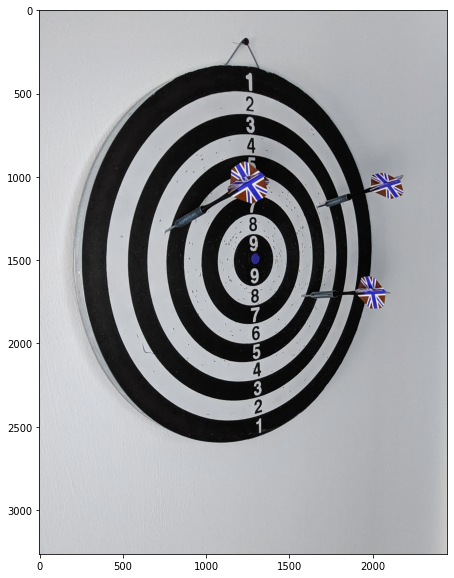

In [171]:
import cv2
import numpy as np


orig_img = cv2.imread("train/Task1/01.jpg")
img = cv2.cvtColor(orig_img,cv2.COLOR_BGR2GRAY)
    # Apply Gaussian blur to reduce noise if necessary
img = cv2.GaussianBlur(img, (5, 5), 0)


sift = cv2.SIFT_create()
kp = sift.detect(gray,None)
img = cv2.drawKeypoints(orig_img,kp,img)

# corners = cv2.goodFeaturesToTrack(gray,25,0.01,10)
# corners = np.int0(corners)
# for i in corners:
#     x,y = i.ravel()
#     cv2.circle(orig_img,(x,y),50,(0,255,0),-1)


plt.figure(figsize=(10,10))
plt.imshow(orig_img)

In [166]:
corners

array([[[1309, 2140]],

       [[1277, 2111]],

       [[1315, 2197]],

       [[1296, 1413]],

       [[1312, 2405]],

       [[1304, 2485]],

       [[ 935, 1256]],

       [[1936, 1606]],

       [[1254,  913]],

       [[1292, 1929]],

       [[1337, 2399]],

       [[ 880, 1773]],

       [[1297, 2037]],

       [[1931, 1620]],

       [[2113, 1116]],

       [[1979, 1717]],

       [[ 788, 1322]],

       [[1746, 1727]],

       [[1328, 2261]],

       [[1272, 1804]],

       [[1320, 2537]],

       [[1275,  790]],

       [[1887, 1710]],

       [[1876, 1132]],

       [[ 894, 2003]]], dtype=int64)

In [84]:
circles = cv2.HoughCircles(img, cv2.HOUGH_GRADIENT, 1.3, 30,
                            param1=150, param2=70, minRadius=30, maxRadius=0)

circles = np.uint16(np.around(circles))
cimg = img.copy()

for c in circles[0, :]:
    cv2.circle(cimg, (c[0], c[1]), c[2], (0, 255, 0), 3)
    cv2.circle(cimg, (c[0], c[1]), 1, (0, 0, 255), 5)



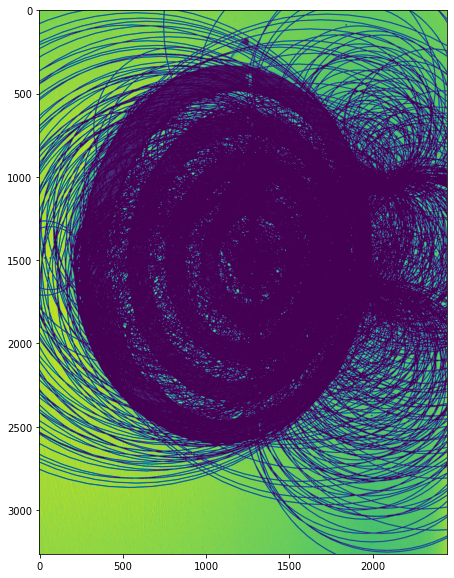

In [85]:
plt.figure(figsize=(10,10))
plt.imshow(cimg)

In [81]:
circles.shape

(1, 1026, 3)